# USL project - Part 3

### Submitted by
Harsh Pundhir

### CONTEXT: 
- The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. 

### DATA DESCRIPTION: 
- The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars

### Steps and tasks: 
1. Data: Import, clean and pre-process the data
2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. 
3. Classifier: Design and train a best fit SVM classier using all the data attributes.
4. Dimensional reduction: perform dimensional reduction on the data.
5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.
6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

#### Submitted by
Harsh Pundhir

### 1. Importing the datasheets

In [1]:
import numpy as pd
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
data = pd.read_csv("Part3 - vehicle.csv")
data.head(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car


In [3]:
data.shape

(846, 19)

- the datasheet has 846 rows and 19 columns

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

- All the attributes except the "class" are of numerical type.

### 2. Pre-Processing of data

In [5]:
data.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

- The data has a few missing values, as the numbers are not high and sufficient rows are availabe, these rows can be dropped.

In [6]:
data.dropna(inplace=True)
data.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [7]:
data.shape

(813, 19)

### 3.Statistical analysis

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,813.0,93.656827,8.233751,73.0,87.0,93.0,100.0,119.0
circularity,813.0,44.803198,6.146659,33.0,40.0,44.0,49.0,59.0
distance_circularity,813.0,82.043050,15.783070,40.0,70.0,79.0,98.0,112.0
radius_ratio,813.0,169.098401,33.615402,104.0,141.0,167.0,195.0,333.0
pr.axis_aspect_ratio,813.0,61.774908,7.973000,47.0,57.0,61.0,65.0,138.0
max.length_aspect_ratio,813.0,8.599016,4.677174,2.0,7.0,8.0,10.0,55.0
scatter_ratio,813.0,168.563346,33.082186,112.0,146.0,157.0,198.0,265.0
elongatedness,813.0,40.988930,7.803380,26.0,33.0,43.0,46.0,61.0
pr.axis_rectangularity,813.0,20.558426,2.573184,17.0,19.0,20.0,23.0,29.0
max.length_rectangularity,813.0,147.891759,14.504648,118.0,137.0,146.0,159.0,188.0


- radius ratio is highly skewed
- scaled variance 1 has the highest variance
- pr.axis rectangularity has the lowest variance
- Many  features look simjlar, dimensionality reduction might do wonders here (will prevents multicollinearity)

#### 3.1 Outlier detection

In [9]:
temp = data.drop(['class'],axis=1)
lower_fence = temp.quantile(q=0.25) - (temp.quantile(q=0.75) - temp.quantile(q=0.25))*1.5
top_fence = temp.quantile(q=0.75) + (temp.quantile(q=0.75) - temp.quantile(q=0.25))*1.5

(temp[temp > top_fence]).count()

compactness                     0
circularity                     0
distance_circularity            0
radius_ratio                    3
pr.axis_aspect_ratio            8
max.length_aspect_ratio        12
scatter_ratio                   0
elongatedness                   0
pr.axis_rectangularity          0
max.length_rectangularity       0
scaled_variance                 1
scaled_variance.1               2
scaled_radius_of_gyration       0
scaled_radius_of_gyration.1    15
skewness_about                 12
skewness_about.1                3
skewness_about.2                0
hollows_ratio                   0
dtype: int64

- Significant outliers in aspect_ratio and radius of gyration

In [10]:
(temp[temp < lower_fence]).count()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        1
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
dtype: int64

- No major lower outliers 

### 4. Visualisation

#### 4.1 Univariate Visualisation

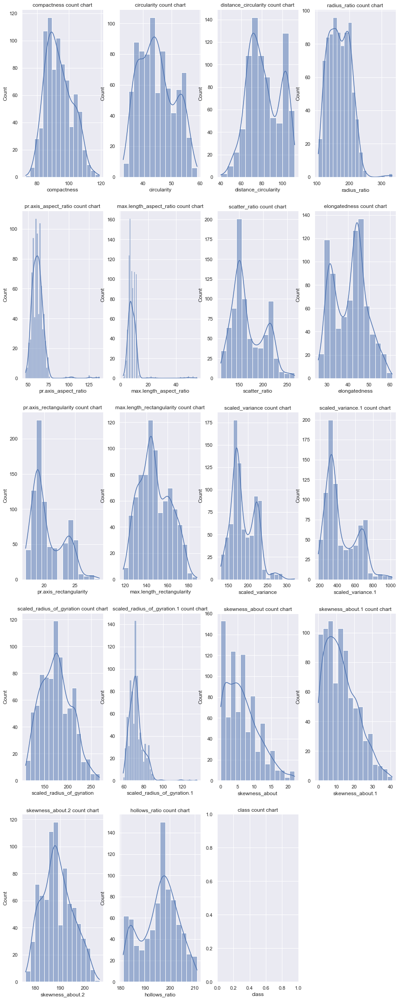

In [11]:
sns.set(color_codes = True)

a = 5  # number of rows
b = 4  # number of columns
c=1

fig = plt.figure(figsize=(15,40))

for i in data.columns:
    
    plt.subplot(a, b, c)
    plt.title('{} count chart'.format(i))
    plt.xlabel(i)
    if(i!='class'):
        sns.histplot(data=data[i],kde=True);           
    c=c+1

- radius ratio and aspect ratio (both) are highly skewed
- scatter ratio, elongatedness and hollows ratio appear bimodal in nature

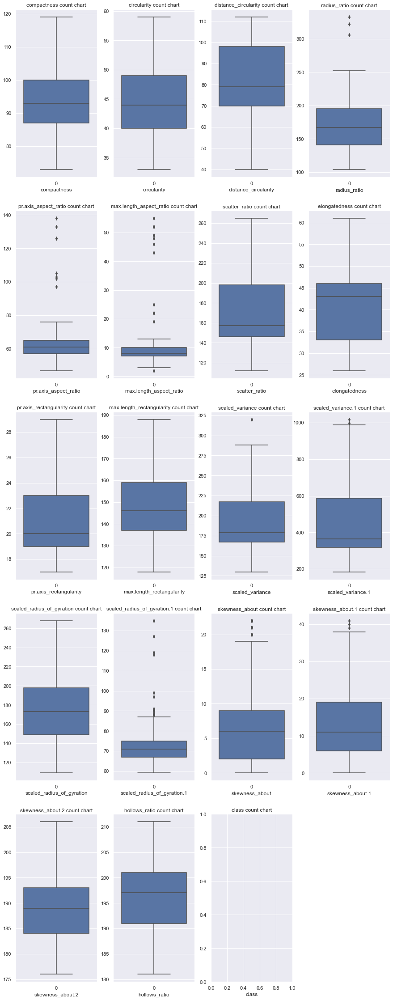

In [12]:
a = 5  # number of rows
b = 4  # number of columns
c=1

fig = plt.figure(figsize=(15,40))

for i in data.columns:
    
    plt.subplot(a, b, c)
    plt.title('{} count chart'.format(i))
    plt.xlabel(i)
    if(i!='class'):
        sns.boxplot(data=data[i]);           
    c=c+1

- The outliers as evaluated before can be visualised here as well.

#### 4.2 Bivariate Visualisation

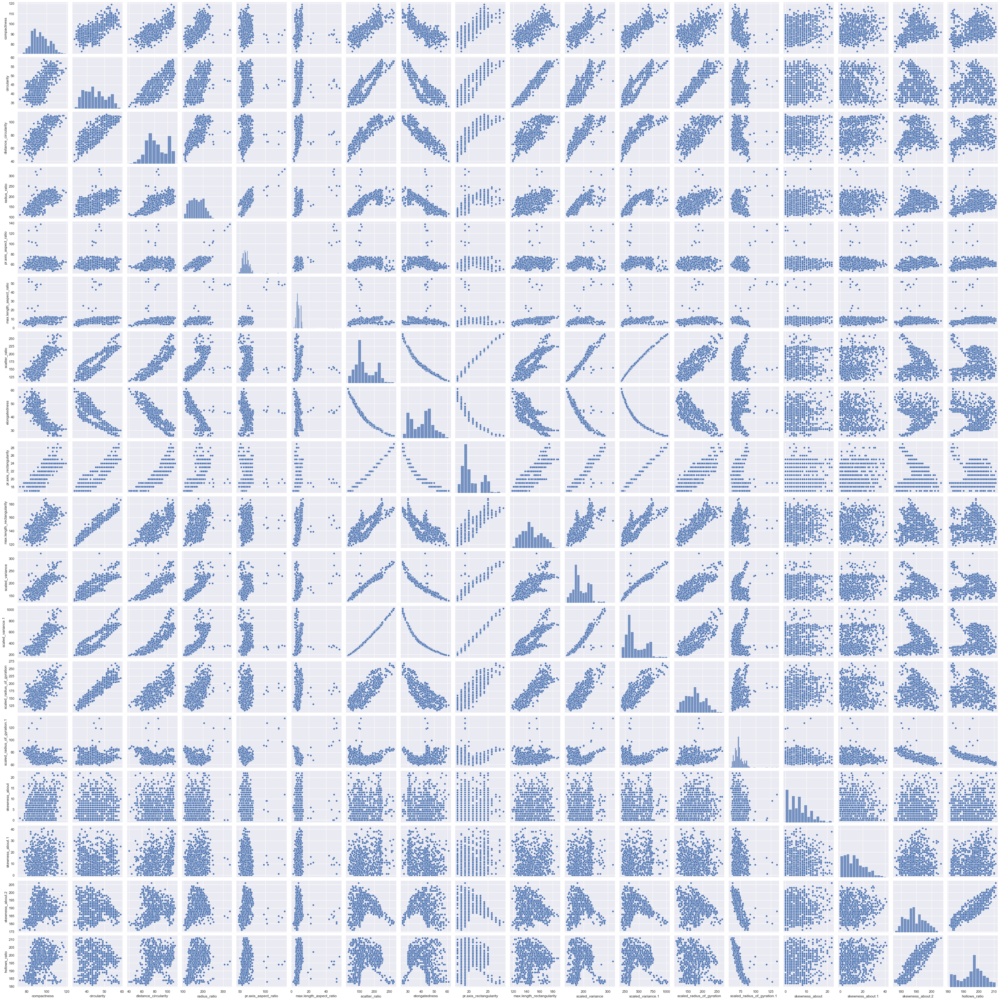

In [13]:
sns.pairplot(data = data);

- scaled variance vs rectangualrity have almost 1 as the correlation coefficient
- scaled variance vs scatter raio have almost 1 as the correlation coefficient
- scatter ratio vs rectangualarity has very high correlation coefficient
- elongatedness vs the many other features has high correlation coefficient

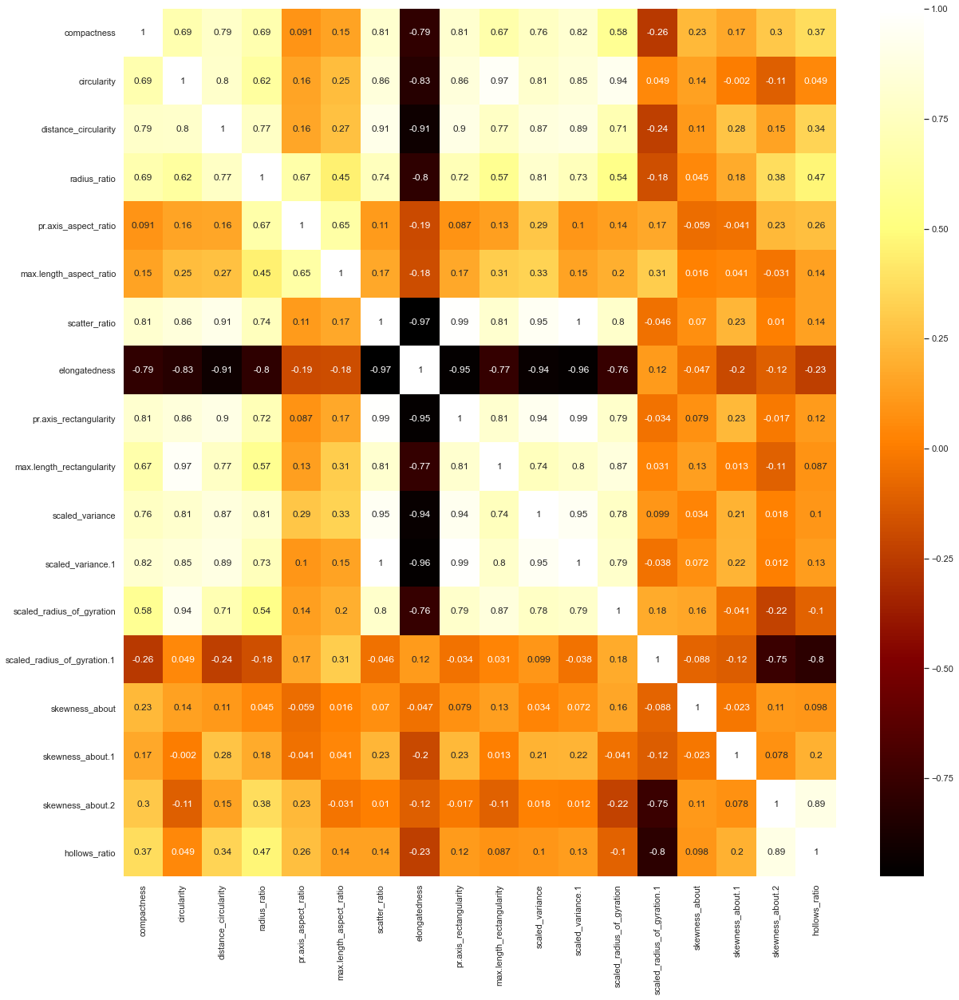

In [14]:
fig = plt.figure(figsize=(20,20))
sns.heatmap(data = data.corr(),annot=True,cmap ='afmhot');


- scaled variance vs rectangualrity have almost 1 as the correlation coefficient
- scaled variance vs scatter raio have almost 1 as the correlation coefficient
- scatter ratio vs rectangualarity has very high correlation coefficient
- elongatedness vs the many other features has high correlation coefficient
- **lot of multicollinearity can be oserved through the correlation matrix**

#### 4.3 Multivariate Visualisation

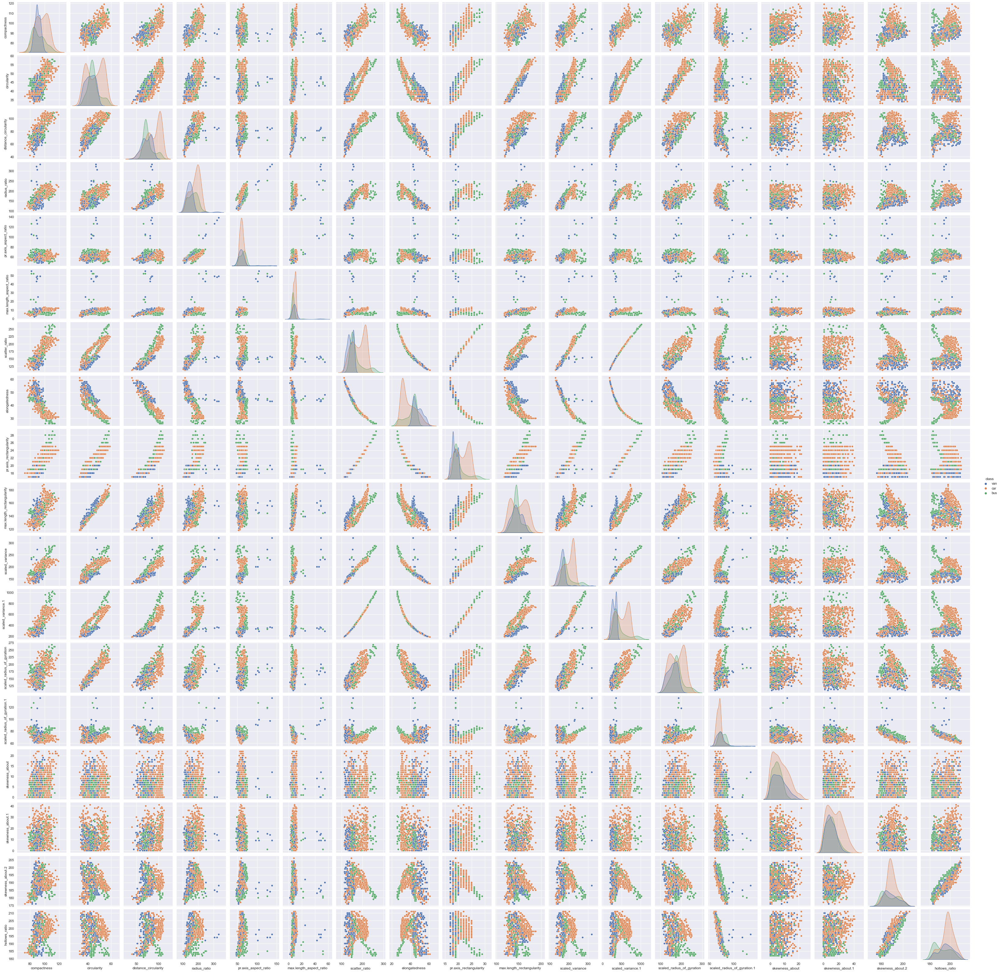

In [15]:
sns.pairplot(data = data,hue='class');

- The outliers are mostlty van or a bus. 
- Buses have high scaled variance.

### 5. Replacing categorical feature to numerical

In [16]:
# replacing/imputing values for class feature
data['class'].replace({'car':1,'van':2,'bus':3},inplace=True)
data

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,1
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,2
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,1
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,1


### 6. Model Building

#### 6.1 SVM on basic datasheet

In [36]:
from sklearn.model_selection import train_test_split

X = data.drop('class',axis=1)
Y = data['class']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

In [41]:
from sklearn import svm
from sklearn.metrics import accuracy_score

# gamma as 0.01 and C as 5 works well here. (higher accuracy can be obtained by lower gamma, but most likely that's overfit)
model = svm.SVC(gamma=0.01, C=5)  
model.fit(x_train , y_train)
y_pred = model.predict(x_test)
accuracy_score(y_test , y_pred)

0.7008196721311475

In [42]:
from scipy.stats import zscore
data_scaled = data.drop('class',axis=1).apply(zscore)
data_scaled['class'] = data['class']
data_scaled
# class column got scaled to -0.89 for 1, 0.306 for 2, 1.506 for 3: Interpretability maintained

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,0.163231,0.520408,0.060669,0.264970,1.283254,0.299721,-0.198517,0.129648,-0.217151,0.766312,-0.397397,-0.339014,0.301676,-0.321192,-0.071523,0.371287,-0.321809,0.171837,2
1,-0.322874,-0.619123,0.124067,-0.836393,-0.599253,0.085785,-0.591720,0.514333,-0.606014,-0.337462,-0.590034,-0.618754,-0.502972,-0.053505,0.538425,0.147109,0.003400,0.442318,2
2,1.256966,0.845988,1.518823,1.187734,0.530251,0.299721,1.162569,-1.152637,0.949438,0.697326,1.111591,1.122486,1.415804,0.080339,1.555006,-0.413338,-0.159204,0.036596,1
3,-0.079822,-0.619123,-0.002729,-0.300595,0.153750,0.085785,-0.742952,0.642562,-0.606014,-0.337462,-0.911095,-0.738643,-1.462359,-1.258099,-0.071523,-0.301249,1.629444,1.524243,2
4,-1.052030,-0.130753,-0.763506,1.068668,5.173770,9.285029,-0.591720,0.514333,-0.606014,-0.268476,1.689501,-0.647299,0.425468,7.307905,0.538425,-0.189159,-1.460039,-1.721531,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,-0.079822,-0.944703,0.314261,0.413803,0.279250,-0.128151,0.013207,-0.126809,-0.217151,-0.958335,0.373150,-0.093528,-0.781504,-0.053505,0.131793,1.380091,-0.159204,-0.098644,1
842,-0.565926,0.194828,0.124067,-0.181529,0.530251,0.513657,-0.289256,0.257876,-0.217151,0.766312,-0.493716,-0.401813,0.054092,-0.053505,-1.088104,0.819644,-0.484413,0.171837,2
843,1.500018,1.497149,1.201833,1.574700,0.655752,0.727593,1.616264,-1.409094,1.727163,1.732113,1.272121,1.613458,0.796844,-0.321192,-0.681472,-0.973784,-0.321809,0.712800,1
844,-0.930504,-1.433074,-0.256321,-0.687560,-0.473753,-0.342087,-1.015169,1.155476,-0.994877,-1.648193,-1.071626,-0.961293,-0.812452,-0.856567,-1.291420,1.380091,0.166004,-0.098644,1


#### 6.1 SVM on scaled datasheet

In [43]:
X = data_scaled.drop('class',axis=1)
Y = data_scaled['class']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
model = svm.SVC(gamma=2, C=5)  
model.fit(x_train , y_train)
y_pred = model.predict(x_test)
accuracy_score(y_test , y_pred)



0.7090163934426229

- The accuracy incraesed a little for the scaled dataset

### 7. PCA

In [44]:
from sklearn.decomposition import PCA

pca = PCA(n_components=19)
pca.fit(data_scaled)

PCA(n_components=19)

In [45]:
pca.explained_variance_ratio_

array([5.07300401e-01, 1.63041059e-01, 1.03599338e-01, 6.27349489e-02,
       5.45926613e-02, 3.52292857e-02, 2.45501526e-02, 1.78976962e-02,
       9.64166170e-03, 6.84535058e-03, 4.63524700e-03, 3.18745519e-03,
       2.29597893e-03, 1.81240198e-03, 9.33083177e-04, 7.54181180e-04,
       6.01203324e-04, 3.28554438e-04, 1.93402732e-05])

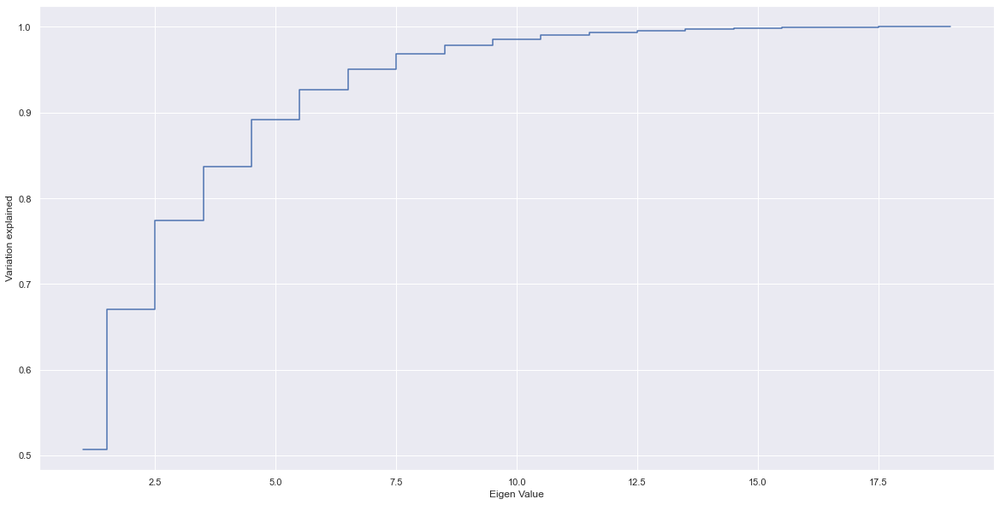

In [46]:
import numpy as np

fig = plt.figure(figsize=(20,10))
plt.step(list(range(1,20)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Variation explained')
plt.xlabel('Eigen Value')
plt.show()

- Choosing the **Eigen value as 8**, provides almost 95% explanation of the Variance.

In [47]:
pca8 = PCA(n_components=8)
pca8.fit(data_scaled)
print(pca8.components_)
print(pca8.explained_variance_ratio_)
data_pca = pca8.transform(data_scaled)

[[ 0.27442537  0.29256166  0.30473036  0.26860175  0.08152791  0.09847152
   0.31588379 -0.31231479  0.31290274  0.27996814  0.30788807  0.31328853
   0.26853117 -0.0284573   0.04078483  0.06455487  0.03195851  0.08145638
  -0.06916126]
 [-0.12363341  0.13834818 -0.07351811 -0.16336339 -0.075023    0.03492626
   0.04636566  0.00930376  0.0577039   0.12385638  0.06862834  0.05027675
   0.21364812  0.49664121 -0.06493321 -0.12977764 -0.52735213 -0.53036588
   0.16045209]
 [-0.10583329 -0.03581821 -0.05610408  0.29008496  0.65266181  0.56553391
  -0.09634911  0.04901089 -0.11160775 -0.02434601  0.06117769 -0.10644318
  -0.03875394  0.25401444 -0.1178657  -0.09032104  0.068054    0.07991446
   0.12459212]
 [ 0.08350212  0.19485324 -0.07652985 -0.04102988  0.03113157 -0.0164474
  -0.08782705  0.07136513 -0.08803819  0.19304079 -0.11465946 -0.08316619
   0.20898951 -0.08775154  0.55035531 -0.69543662  0.13169373  0.05907407
   0.09829146]
 [ 0.03026199 -0.04838005  0.05753001 -0.05033936 -0.

In [48]:
dataF_pca = pd.DataFrame(data_pca)
dataF_pca

,0,1,2,3,4,5,6,7
0,0.332893,-0.070653,0.992737,0.188614,0.057778,-0.155277,-1.002123,-0.570182
1,-1.587799,-0.424704,-0.351391,0.198476,0.596512,0.020739,-0.447684,0.445803
2,3.824489,0.183887,-0.012380,1.102414,0.966351,0.247570,0.836345,-0.404994
3,-1.715732,-2.760078,0.331563,0.458523,-0.470748,-0.190486,-0.411385,0.609046
4,0.410883,5.516591,11.138216,-0.435097,3.724043,0.306182,0.156815,2.773165
...,...,...,...,...,...,...,...,...
808,-0.363640,-0.712176,0.092415,-1.577869,1.019021,0.475162,0.832652,-0.415058
809,-0.313250,0.267536,0.739688,-0.883750,-0.224594,-0.747097,-1.370042,-0.275532
810,4.868821,0.050349,0.460970,0.352049,-0.850973,-1.185333,0.618232,0.238169
811,-3.203742,-1.197063,-0.443390,-1.996620,0.193896,-0.658102,-0.009535,-0.454450


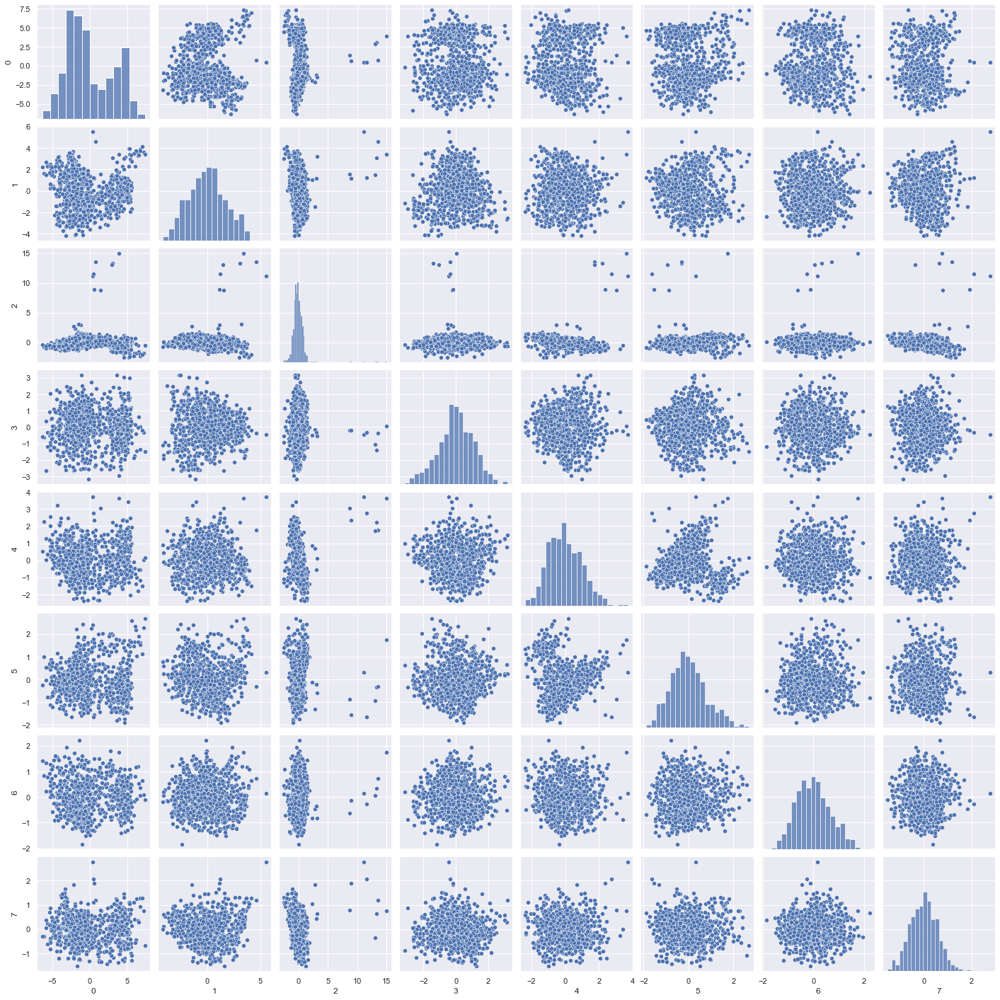

In [26]:
sns.pairplot(pd.DataFrame(data_pca))


- The data entries now look more non-linear as compared to the initial data. That's cool!

In [49]:
dataF_pca['class']=data_scaled['class']

In [50]:
dataF_pca.dropna(inplace=True)

#### 7.1 SVM on PCA applied datasheet

In [51]:
X = dataF_pca.drop('class',axis=1)
Y = dataF_pca['class']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
model = svm.SVC(gamma=0.01, C=5)  
model.fit(x_train , y_train)
y_pred = model.predict(x_test)
accuracy_score(y_test , y_pred)

0.5470085470085471

- For the dataset, after performing SVM after the pca analysis. The accuracy decreased, this was supposed to happen as the feature dropped down
- But still, the magnitue of accuracy is good and the pca applied data was able to capture a lot of information.

## 8. Conclusion

- A lot of multicollinearity was observed in the initial data.
- Many features had correlation value as high as 0.95 and as low as -0.98.
- The accuracy of the SVM model (before pca and withput scaling) was ~ 70%.
- After scaling the model accuracy remained almost the same.
- number of componets for the PCA was finalised as 8, as it covered 95% of the variance.
- After PCA, the model accuracy went down to ~55%, this was most likely to happen as features were dropped.
- However, the model after PCA ran quite fastly and managed to capture a lot of information.
- Pairplot after the SVM model over PCA showed that the multicollinearity was eliminated to a great extent.